In [1]:
import numpy
import gzip
import numpy as np
import pandas as pd
import sys, glob
import urllib3
import h5py
import cdsapi, zipfile, os, time
import warnings
import shutil
import xarray
from datetime import date
warnings.filterwarnings('ignore')
import pycountry
import json

sys.path.append(os.path.expanduser("~")+'/CEUAS/CEUAS/public/cds-backend/code/')
import cds_eua4 as eua
sys.path.append(os.path.expanduser("~")+'/uvpy/')
import uvfunctions as uvf
import uvplot as uvp
import uvtests as uvt

import matplotlib
import matplotlib.pylab as plt
import matplotlib.pyplot as maplt
matplotlib.rcParams.update({'font.size': 20})
matplotlib.rcParams['figure.figsize'] = (20, 10)
font = {'family' : 'normal',
    # 'weight' : 'bold',
    'size'   : 20}
matplotlib.rc('font', **font)

from ipywidgets import IntProgress
from IPython.display import display
from IPython.display import Image

In [2]:
df = uvt.check_adjustments(
        directory = '/mnt/users/scratch/leo/scratch/converted_v11/long/',
        date_from = '2022-01-01',
        date_to = '2022-12-31'
)

IntProgress(value=0, max=15214)

KeyboardInterrupt: 

In [3]:
uvp.plot_std_plevs_from_file(
    file_name = glob.glob('/mnt/users/scratch/leo/scratch/converted_v11/long/*11035*_CEUAS_merged_v1.nc')[0],
    date_from = '2022-01-01',
    date_to = '2022-12-31',
    variable = 'air_temperature',
    adjusted = True,
    adjustment = 'RAOBCORE_bias_estimate'
)



KeyError: "Unable to open object (object 'advanced_homogenisation' doesn't exist)"

In [ ]:
rq = {'variable': ['air_temperature'], 'statid': '11035', 'date': '20221231-20221231','optional': ['RAOBCORE_bias_estimate', 'RISE_bias_estimate', 'RASE_bias_estimate', 'RICH_bias_estimate',], 'format': 'nc'} # 0-20999-0-ZEKG

df = eua.vm_request_wrapper(rq , overwrite=True)# , vm_url='http://127.0.0.1:8009')

df = df.to_dataframe()
display(df)
# del df

fig, axs = plt.subplots(2,2)
fig.suptitle('Homogenistation Check')

axs[0][0].plot(df.ta, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='temperature')
axs[0][0].plot((df.ta - df.RAOBCORE_bias_estimate), df.plev, 'o', color = 'orange',markersize = 4, alpha = 0.2, label='RAOBCORE temperature')

axs[0][1].plot(df.ta, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='temperature')
axs[0][1].plot((df.ta - df.RASE_bias_estimate), df.plev, 'o', color = 'yellow',markersize = 4, alpha = 0.2, label='RASE temperature')

axs[1][0].plot(df.ta, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='temperature')
axs[1][0].plot((df.ta - df.RICH_bias_estimate), df.plev, 'o', color = 'brown',markersize = 4, alpha = 0.2, label='RICH temperature')

axs[1][1].plot(df.ta, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='temperature')
axs[1][1].plot((df.ta - df.RISE_bias_estimate), df.plev, 'o', color = 'red',markersize = 4, alpha = 0.2, label='RISE temperature')

for ax in axs.flat:
    ax.set(xlabel='temperature [K]', ylabel='pressure [Pa]', ylim=ax.get_ylim()[::-1])
    ax.set_title(None)
    ax.grid()
    ax.legend()

fig.tight_layout()
fig.show()


In [4]:
rq = {'variable': ['relative_humidity'], 'statid': '11035', 'date': '20221231-20221231','optional': ['humidity_bias_estimate',], 'format': 'nc'} # 0-20999-0-ZEKG

# df = eua.vm_request_wrapper(rq , overwrite=True , vm_url='http://127.0.0.1:8009')
df = eua.vm_request_wrapper(rq , overwrite = True, vm_url='http://127.0.0.1:8009')

df = df.to_dataframe()
display(df)
# del df

fig, axs = plt.subplots(1)
fig.suptitle('Homogenistation Check')

axs.plot(df.hur, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='humidity')
axs.plot((df.hur - df.humidity_bias_estimate), df.plev, 'o', color = 'orange',markersize = 5, alpha = 0.7, label='adjusted humidity')
axs.set(xlabel='relative humidity [1]', ylabel='pressure [Pa]', ylim=axs.get_ylim()[::-1])
axs.set_title(None)
axs.grid()
axs.legend()

fig.tight_layout()
fig.show()


RuntimeError: Internal Server Error

,lat,lon,obs,plev,report_id,station_id,time,ua,wind_bias_estimate
0,48.248871,16.35759,0,380.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,74.686432,-2.235010e-06
1,48.248871,16.35759,0,390.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,86.784409,1.196655e-06
2,48.248871,16.35759,0,400.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,84.411598,-3.474570e-06
3,48.248871,16.35759,0,410.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,84.962601,-7.481032e-08
4,48.248871,16.35759,0,420.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,84.384399,-8.002264e-07
...,...,...,...,...,...,...,...,...,...
2528,48.248871,16.35759,0,99440.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,1.057515,8.114066e-09
2529,48.248871,16.35759,0,99470.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,1.098807,-2.301110e-08
2530,48.248871,16.35759,0,99530.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,1.016842,-3.241820e-08
2531,48.248871,16.35759,0,99540.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,1.016842,-3.241820e-08


NameError: name 'ax' is not defined

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


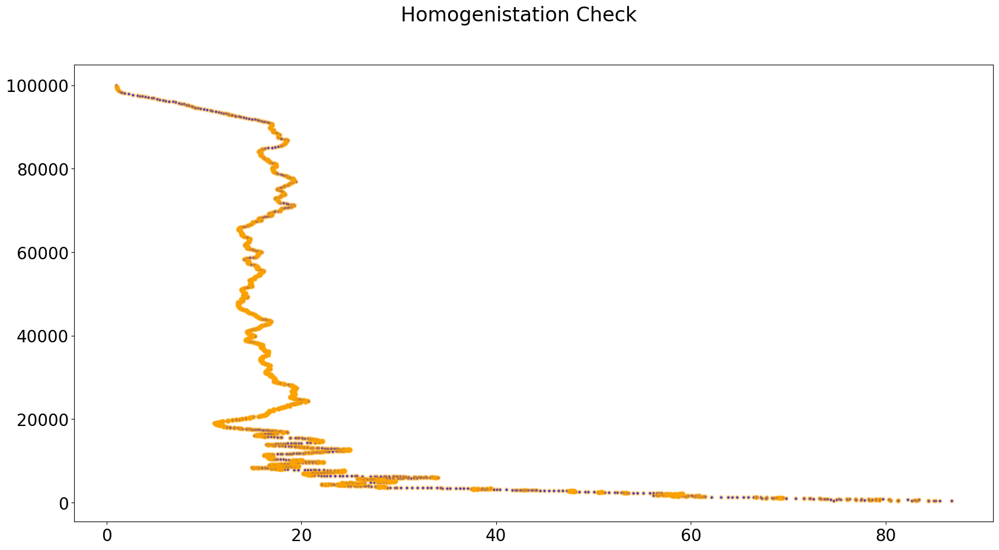

In [5]:
rq = {'variable': ['eastward_wind_speed'], 'statid': '11035', 'date': '20221231-20221231','optional': ['wind_bias_estimate',], 'format': 'nc'} # 0-20999-0-ZEKG

df = eua.vm_request_wrapper(rq , overwrite=True)# , vm_url='http://127.0.0.1:8009')

df = df.to_dataframe()
display(df)
# del df

fig, axs = plt.subplots(1)
fig.suptitle('Homogenistation Check')

axs.plot(df.ua, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='eastward wind speed')
axs.plot((df.ua - df.wind_bias_estimate), df.plev, 'o', color = 'orange',markersize = 5, alpha = 0.3, label='adjusted eastward wind speed')
axs.set(xlabel='eastward wind speed [m/s]', ylabel='pressure [Pa]', ylim=ax.get_ylim()[::-1])
axs.set_title(None)
axs.grid()
axs.legend()

fig.tight_layout()
fig.show()


,lat,lon,obs,plev,report_id,station_id,time,va,wind_bias_estimate
0,48.248871,16.35759,0,380.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,-28.669436,4.625254e-07
1,48.248871,16.35759,0,390.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,-35.063179,1.370709e-06
2,48.248871,16.35759,0,400.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,-37.582466,3.153465e-07
3,48.248871,16.35759,0,410.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,-36.064484,7.093986e-07
4,48.248871,16.35759,0,420.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,-30.713409,4.905796e-07
...,...,...,...,...,...,...,...,...,...
2528,48.248871,16.35759,0,99440.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,2.375218,2.963923e-08
2529,48.248871,16.35759,0,99470.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,2.356400,4.684958e-08
2530,48.248871,16.35759,0,99530.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,2.283864,-5.841765e-08
2531,48.248871,16.35759,0,99540.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,2.283864,-5.841765e-08


NameError: name 'ax' is not defined

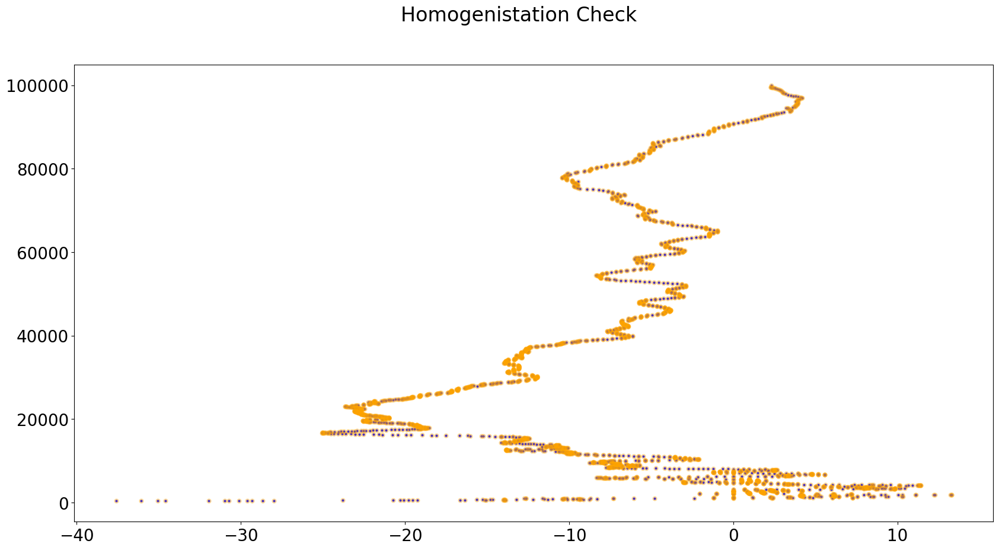

In [6]:
rq = {'variable': ['northward_wind_speed'], 'statid': '11035', 'date': '20221231-20221231','optional': ['wind_bias_estimate',], 'format': 'nc'} # 0-20999-0-ZEKG

df = eua.vm_request_wrapper(rq , overwrite=True)#  , vm_url='http://127.0.0.1:8009')

df = df.to_dataframe()
display(df)
# del df

fig, axs = plt.subplots(1)
fig.suptitle('Homogenistation Check')

axs.plot(df.va, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='northward wind speed')
axs.plot((df.va - df.wind_bias_estimate), df.plev, 'o', color = 'orange',markersize = 5, alpha = 0.3, label='adjusted northward wind speed')
axs.set(xlabel='northward wind speed [m/s]', ylabel='pressure [Pa]', ylim=ax.get_ylim()[::-1])
axs.set_title(None)
axs.grid()
axs.legend()

fig.tight_layout()
fig.show()


# 1946

In [7]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'air_temperature',
    output_var =  'ta',
    adj = 'RAOBCORE_bias_estimate',
    date = '19460101-19461231',
    data_type = 'adjusted',
    show = True,
) 
img = fig.to_image(format="png")
Image(img)


KeyboardInterrupt



In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'eastward_wind_speed',
    output_var =  'ua',
    adj = 'wind_bias_estimate',
    date = '19460101-19461231',
    data_type = 'adjusted',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'northward_wind_speed',
    output_var =  'va',
    adj = 'wind_bias_estimate',
    date = '19460101-19461231',
    data_type = 'adjusted',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

# 1925
---

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'air_temperature',
    output_var =  'ta',
    adj = 'RAOBCORE_bias_estimate',
    date = '19250101-19251231',
    data_type = 'observation',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'air_temperature',
    output_var =  'ta',
    adj = 'RAOBCORE_bias_estimate',
    date = '19250101-19251231',
    data_type = 'adjusted',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'eastward_wind_speed',
    output_var =  'ua',
    adj = 'wind_bias_estimate',
    date = '19250101-19251231',
    data_type = 'adjusted',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'northward_wind_speed',
    output_var =  'va',
    adj = 'wind_bias_estimate',
    date = '19250101-19251231',
    data_type = 'adjusted',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'eastward_wind_speed',
    output_var =  'ua',
    adj = 'wind_bias_estimate',
    date = '19250101-19251231',
    data_type = 'adjusted',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'northward_wind_speed',
    output_var =  'va',
    adj = 'wind_bias_estimate',
    date = '19250101-19251231',
    data_type = 'adjusted',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

# 1945 0-72* only
---

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'air_temperature',
    output_var =  'ta',
    adj = 'RAOBCORE_bias_estimate',
    date = '19450101-19451231',
    data_type = 'adjusted',
    statid = 'all',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'northward_wind_speed',
    output_var =  'va',
    adj = 'wind_bias_estimate',
    date = '19450101-19451231',
    data_type = 'adjustments',
    statid = 'all',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'northward_wind_speed',
    output_var =  'va',
    adj = 'wind_bias_estimate',
    date = '19450101-19451231',
    data_type = 'observation',
    statid = 'all',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'eastward_wind_speed',
    output_var =  'ua',
    adj = 'wind_bias_estimate',
    date = '19450101-19451231',
    data_type = 'adjustments',
    statid = 'all',
    show = False,
) 
img = fig.to_image(format="png")
Image(img)

In [ ]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'eastward_wind_speed',
    output_var =  'ua',
    adj = 'wind_bias_estimate',
    date = '19450101-19451231',
    data_type = 'observation',
    statid = 'all',
    show = False,
) 
img = fig.to_image(format="png")
Image(img) 

# Trends in relative humidity

## 1993-2023 700 hPa

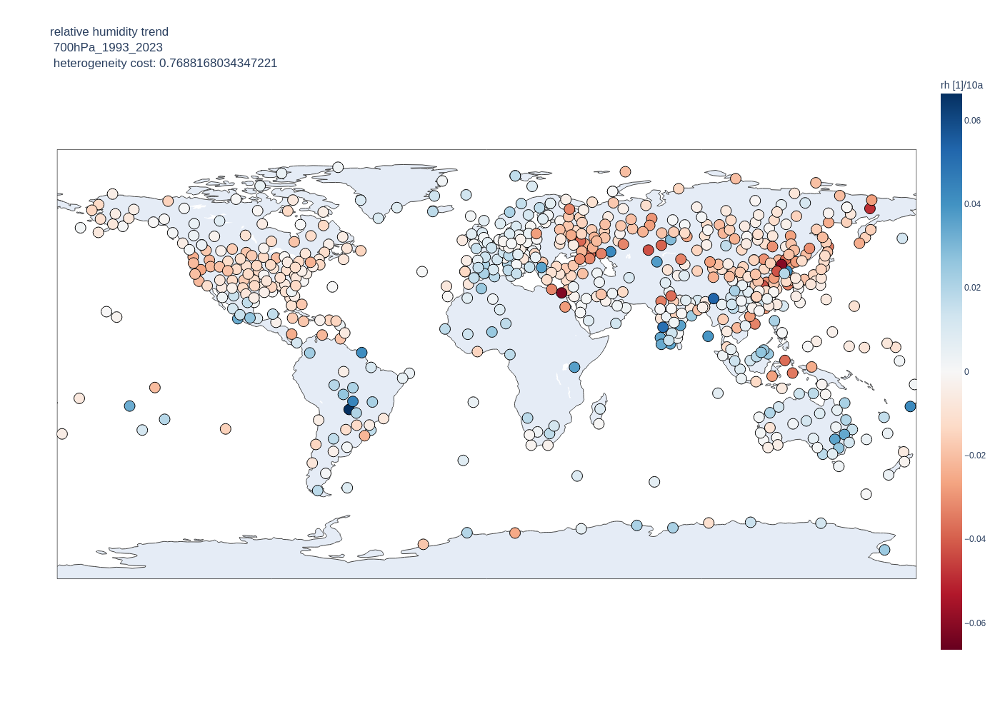

In [57]:
import pickle
sys.path.append(os.getcwd()+'/../resort/rasotools-master/')
import rasotools

good_results = {}
good_results['lat'] = []
good_results['lon'] = []
good_results['st'] = []
good_results['at'] = []
good_results['label'] = []
results = pickle.load(open('trends_700hPa_1993_2023_Trend.p', 'rb'))
for i in results:
    badflag = 0
    for j in i:
        try:
            if np.isnan(j):
                badflag = 1
        except:
            pass
    if badflag == 0:
        good_results['lat'].append(i[1])
        good_results['lon'].append(i[2])
        good_results['st'].append(i[3][0])
        good_results['at'].append(i[4][0])
        good_results['label'].append(i[0].split('/')[-1].split('_')[0])
da = pd.DataFrame.from_dict(good_results)

statnum = len(da)

a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da.st))
cost = np.sum(a)/len(a)
fig1 = uvp.world_map_plot(da.st, da.lat, da.lon, da.label, 'relative humidity trend <br> 700hPa_1993_2023 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a') # 

img = fig1.to_image(format="png")
Image(img) 



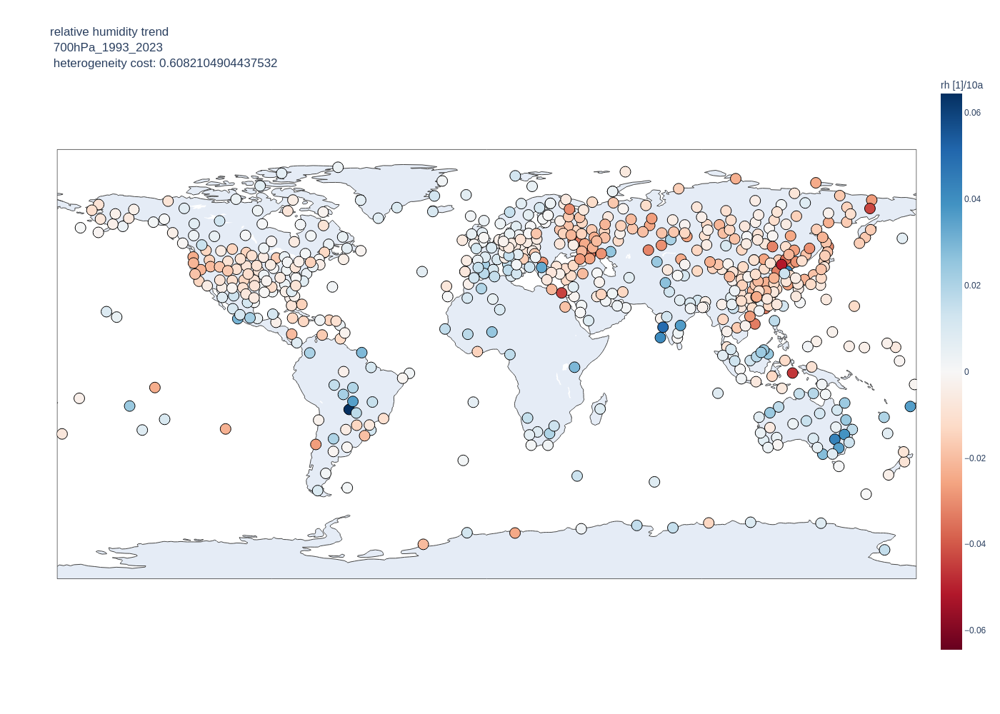

In [33]:
import pickle
sys.path.append(os.getcwd()+'/../resort/rasotools-master/')
import rasotools

good_results = {}
good_results['lat'] = []
good_results['lon'] = []
good_results['st'] = []
good_results['at'] = []
good_results['label'] = []
results = pickle.load(open('polyfit_trends_700hPa_1993_2023_Trend.p', 'rb'))
for i in results:
    badflag = 0
    for j in i:
        try:
            if np.isnan(j):
                badflag = 1
        except:
            pass
    if badflag == 0:
        good_results['lat'].append(i[1])
        good_results['lon'].append(i[2])
        good_results['st'].append(i[3][0])
        good_results['at'].append(i[4][0])
        good_results['label'].append(i[0].split('/')[-1].split('_')[0])
da = pd.DataFrame.from_dict(good_results)

statnum = len(da)

a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da.st))
cost = np.sum(a)/len(a)
fig1 = uvp.world_map_plot(da.st, da.lat, da.lon, da.label, 'relative humidity trend <br> 700hPa_1993_2023 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a') # 

img = fig1.to_image(format="png")
Image(img) 



,lat,lon,st,at,label,heterogeneity
121,-19.000000,-57.669998,0.064445,0.024371,0-20000-0-83554,12.594614
197,-31.484240,145.829575,0.043650,0.043650,0-20000-0-94711,5.250660
399,-15.650000,-56.099998,0.035657,-0.012098,0-20000-0-83362,4.517704
401,-29.490480,149.847015,0.038723,0.037712,0-20000-0-95527,4.229131
554,-35.157921,147.456711,0.035050,0.026541,0-20000-0-94910,3.770573


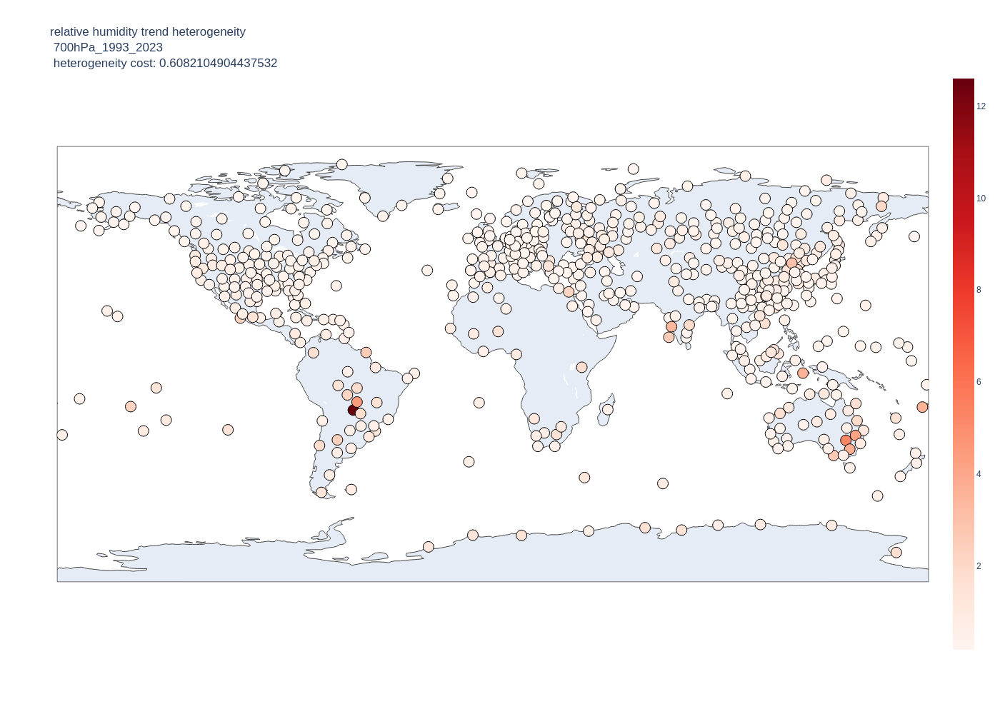

In [34]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'relative humidity trend heterogeneity <br> 700hPa_1993_2023 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 


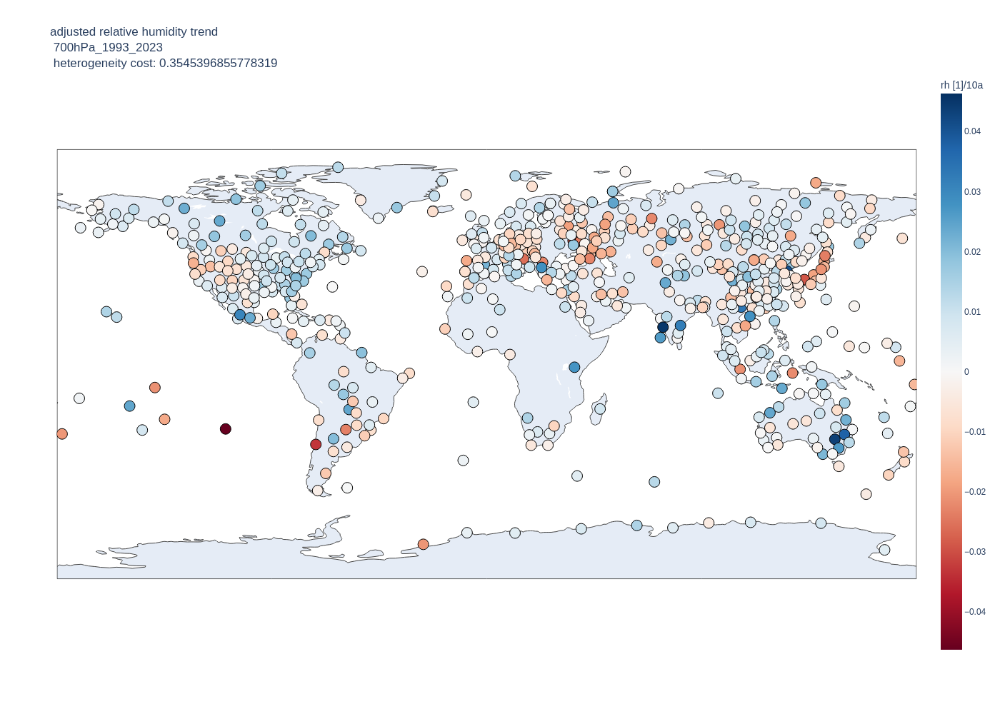

In [35]:
a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da['at']))
cost = np.sum(a)/len(a)
fig2 = uvp.world_map_plot(da['at'], da.lat, da.lon, da.label, 'adjusted relative humidity trend <br> 700hPa_1993_2023 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a')

img = fig2.to_image(format="png")
Image(img) 

,lat,lon,st,at,label,heterogeneity
376,-27.160000,-109.430000,-0.022796,-0.046333,0-20000-0-85469,6.203529
197,-31.484240,145.829575,0.043650,0.043650,0-20000-0-94711,4.322118
110,-33.653938,-71.612694,-0.027123,-0.033292,0-20000-0-85586,3.641251
401,-29.490480,149.847015,0.038723,0.037712,0-20000-0-95527,3.250167
330,15.480000,73.820000,0.050115,0.045191,0-20000-0-43192,2.466753


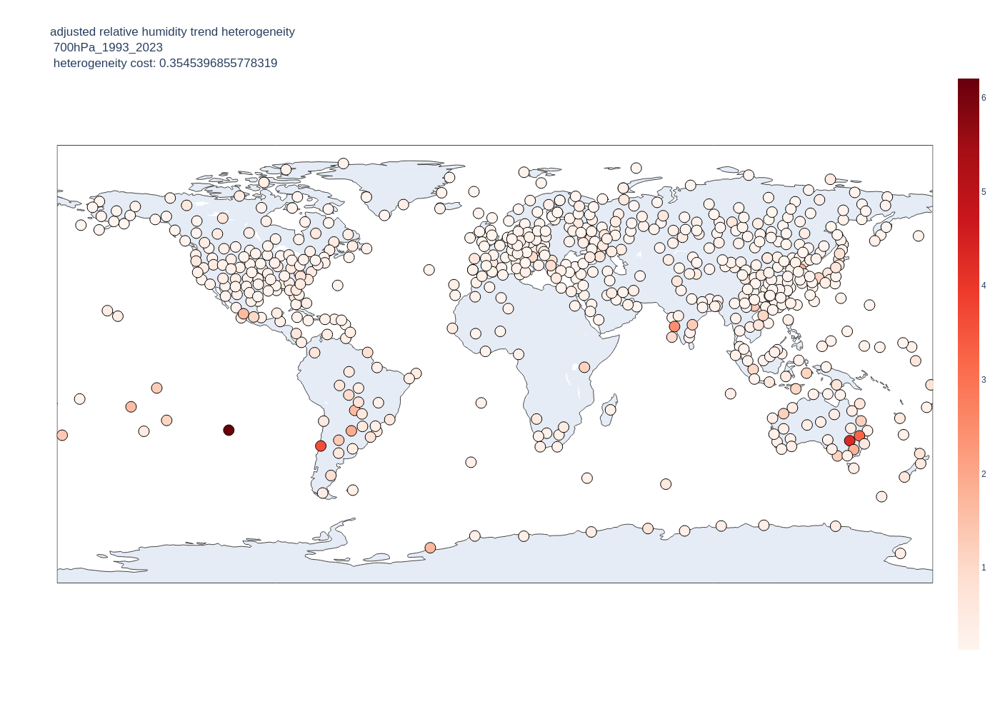

In [36]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'adjusted relative humidity trend heterogeneity <br> 700hPa_1993_2023 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

## 1993-2023 300 hPa

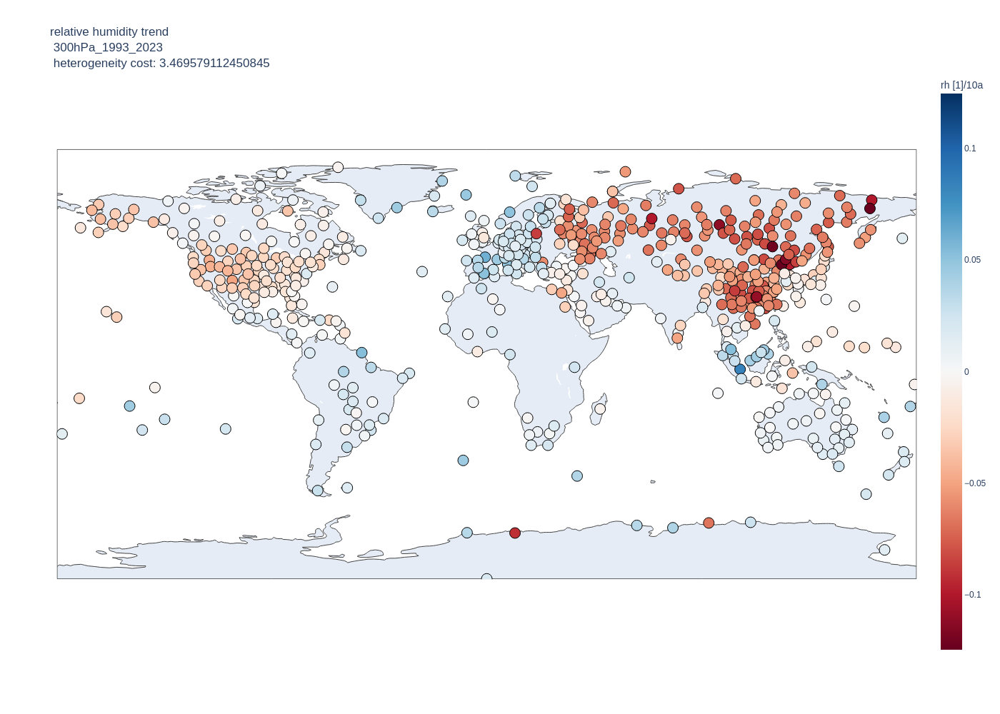

In [37]:
import pickle
sys.path.append(os.getcwd()+'/../resort/rasotools-master/')
import rasotools

good_results = {}
good_results['lat'] = []
good_results['lon'] = []
good_results['st'] = []
good_results['at'] = []
good_results['label'] = []
results = pickle.load(open('polyfit_trends_300hPa_1993_2023_Trend.p', 'rb'))
for i in results:
    badflag = 0
    for j in i:
        try:
            if np.isnan(j):
                badflag = 1
        except:
            pass
    if badflag == 0:
        good_results['lat'].append(i[1])
        good_results['lon'].append(i[2])
        good_results['st'].append(i[3][0])
        good_results['at'].append(i[4][0])
        good_results['label'].append(i[0].split('/')[-1].split('_')[0])
da = pd.DataFrame.from_dict(good_results)

statnum = len(da)

a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da.st))
cost = np.sum(a)/len(a)
fig1 = uvp.world_map_plot(da.st, da.lat, da.lon, da.label, 'relative humidity trend <br> 300hPa_1993_2023 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a') # 

img = fig1.to_image(format="png")
Image(img) 



,lat,lon,st,at,label,heterogeneity
371,41.730000,123.519997,-0.124557,-0.027814,0-20000-0-54342,15.429986
497,-70.769997,11.830000,-0.092182,-0.026674,0-20000-0-89512,15.303085
272,-40.349998,-9.880000,0.045082,0.017998,0-20000-0-68906,15.252733
83,-2.170000,106.129997,0.084150,0.000434,0-20000-0-96237,14.464720
55,4.822090,-52.365341,0.053250,0.023819,0-20000-0-81405,14.256726


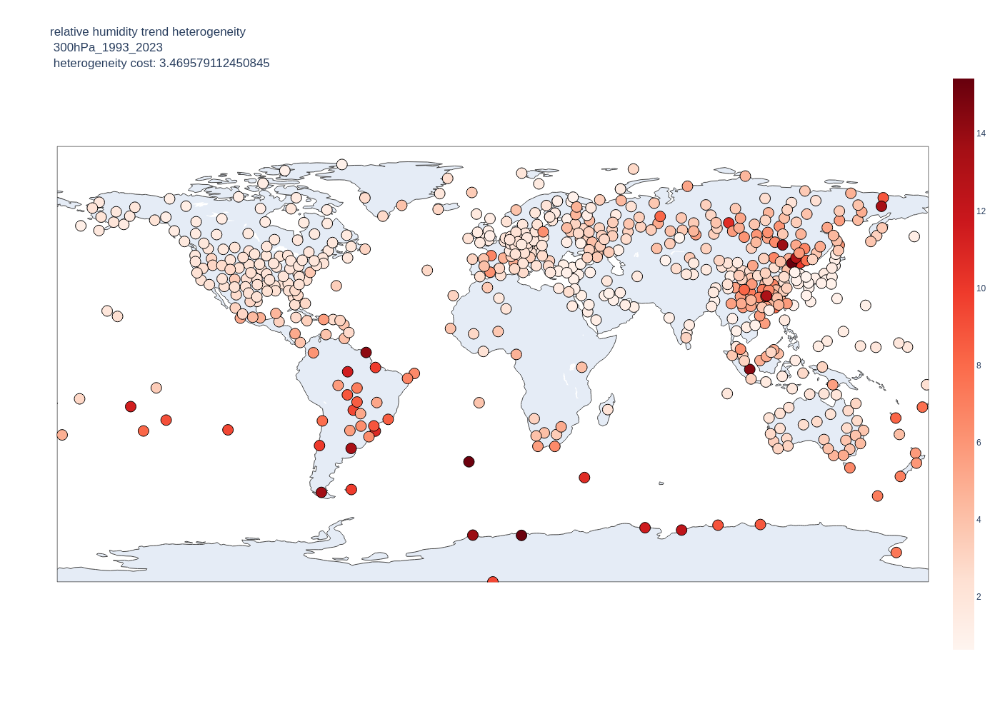

In [38]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'relative humidity trend heterogeneity <br> 300hPa_1993_2023 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

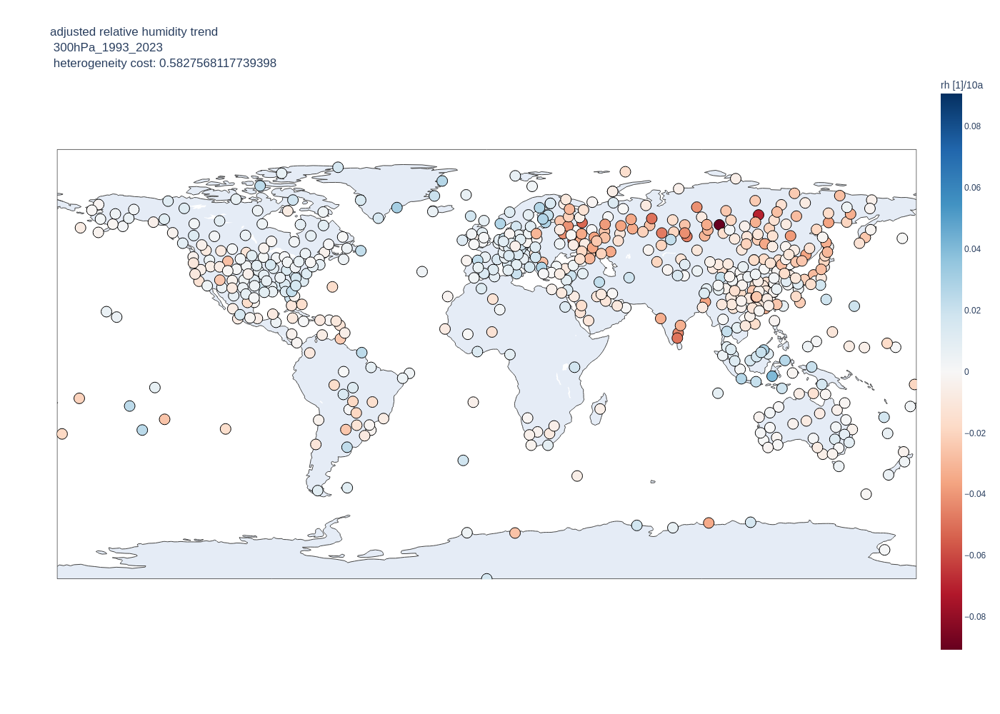

In [39]:
a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da['at']))
cost = np.sum(a)/len(a)
fig2 = uvp.world_map_plot(da['at'], da.lat, da.lon, da.label, 'adjusted relative humidity trend <br> 300hPa_1993_2023 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a')

img = fig2.to_image(format="png")
Image(img) 

,lat,lon,st,at,label,heterogeneity
126,58.382339,97.449127,-0.111468,-0.090729,0-20000-0-29282,6.722955
168,28.110001,112.790001,-0.071831,-0.070084,0-20000-0-57687,5.506773
259,62.534409,113.867813,-0.069462,-0.070352,0-20000-0-24726,4.077183
335,-66.557114,93.001068,-0.067486,-0.034477,0-20000-0-89592,3.287434
109,10.920000,79.830002,-0.049246,-0.049246,0-20000-0-43346,3.204406


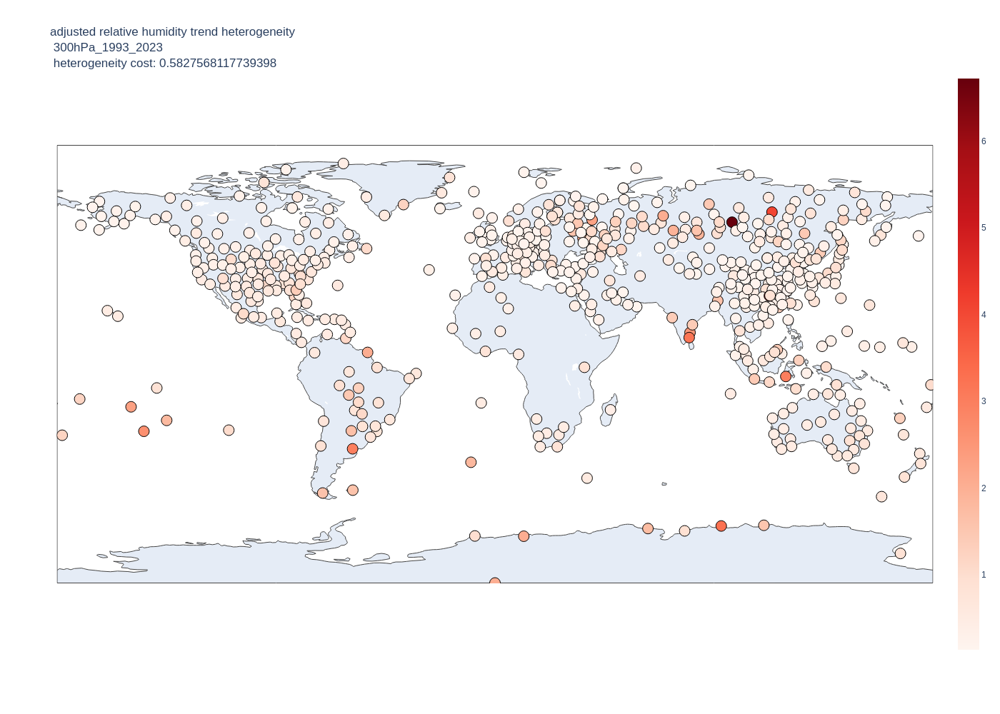

In [40]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'adjusted relative humidity trend heterogeneity <br> 300hPa_1993_2023 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

## 1973 - 2003 700 hPa

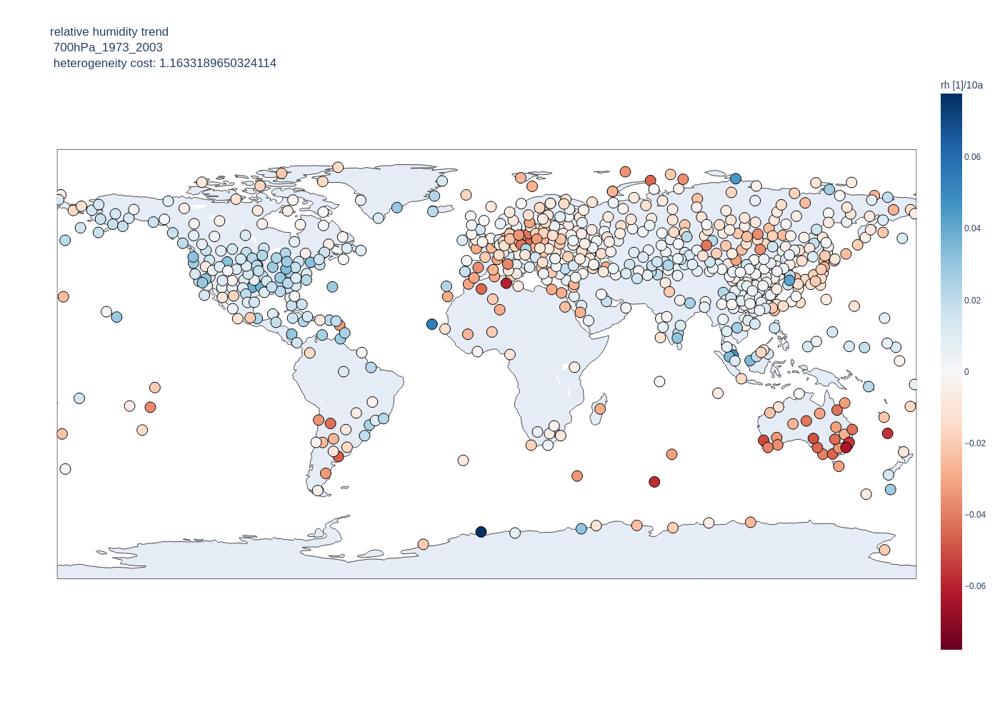

In [41]:
import pickle
sys.path.append(os.getcwd()+'/../resort/rasotools-master/')
import rasotools

good_results = {}
good_results['lat'] = []
good_results['lon'] = []
good_results['st'] = []
good_results['at'] = []
good_results['label'] = []
results = pickle.load(open('polyfit_trends_700hPa_1973_2003_Trend.p', 'rb'))
for i in results:
    badflag = 0
    for j in i:
        try:
            if np.isnan(j):
                badflag = 1
        except:
            pass
    if badflag == 0:
        good_results['lat'].append(i[1])
        good_results['lon'].append(i[2])
        good_results['st'].append(i[3][0])
        good_results['at'].append(i[4][0])
        good_results['label'].append(i[0].split('/')[-1].split('_')[0])
da = pd.DataFrame.from_dict(good_results)

statnum = len(da)

a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da.st))
cost = np.sum(a)/len(a)
fig1 = uvp.world_map_plot(da.st, da.lat, da.lon, da.label, 'relative humidity trend <br> 700hPa_1973_2003 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a')

img = fig1.to_image(format="png")
Image(img) 



,lat,lon,st,at,label,heterogeneity
666,-70.320000,-2.370000,0.077763,-0.030644,0-20300-0-89001,22.555836
698,-34.950001,150.529999,-0.063345,-0.063345,0-20000-0-94750,10.967677
386,-49.349998,70.250000,-0.057871,-0.060665,0-20000-0-61998,10.329908
503,-29.030001,167.929993,-0.056540,-0.055739,0-20000-0-94996,8.570842
567,-33.930000,151.169998,-0.055246,-0.055246,0-20000-0-94767,8.397758


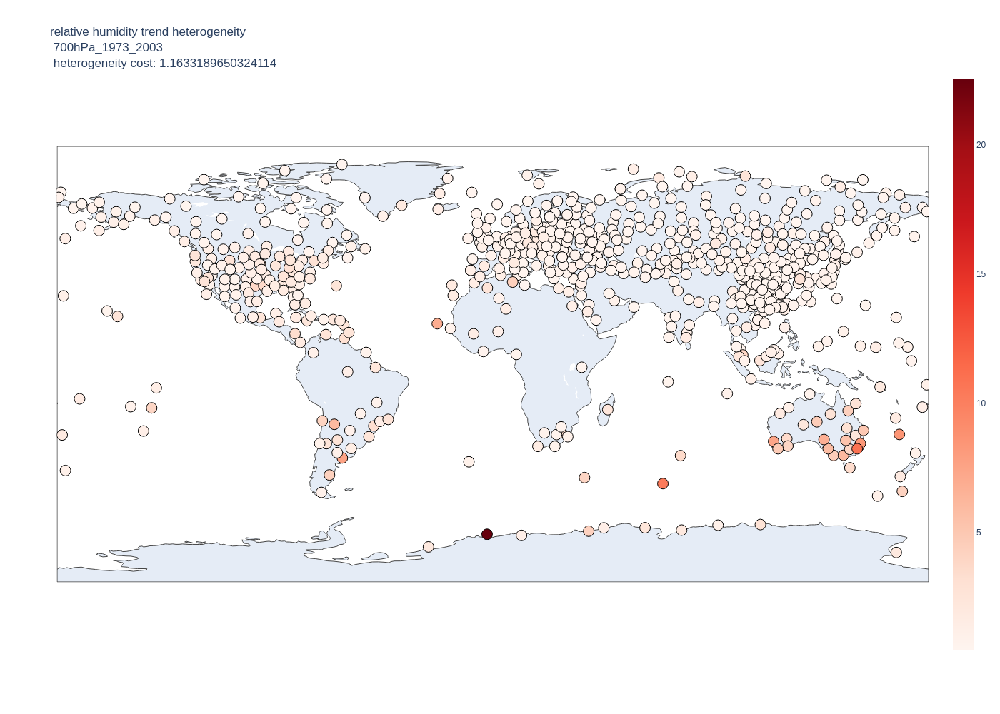

In [42]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'relative humidity trend heterogeneity <br> 700hPa_1973_2003 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

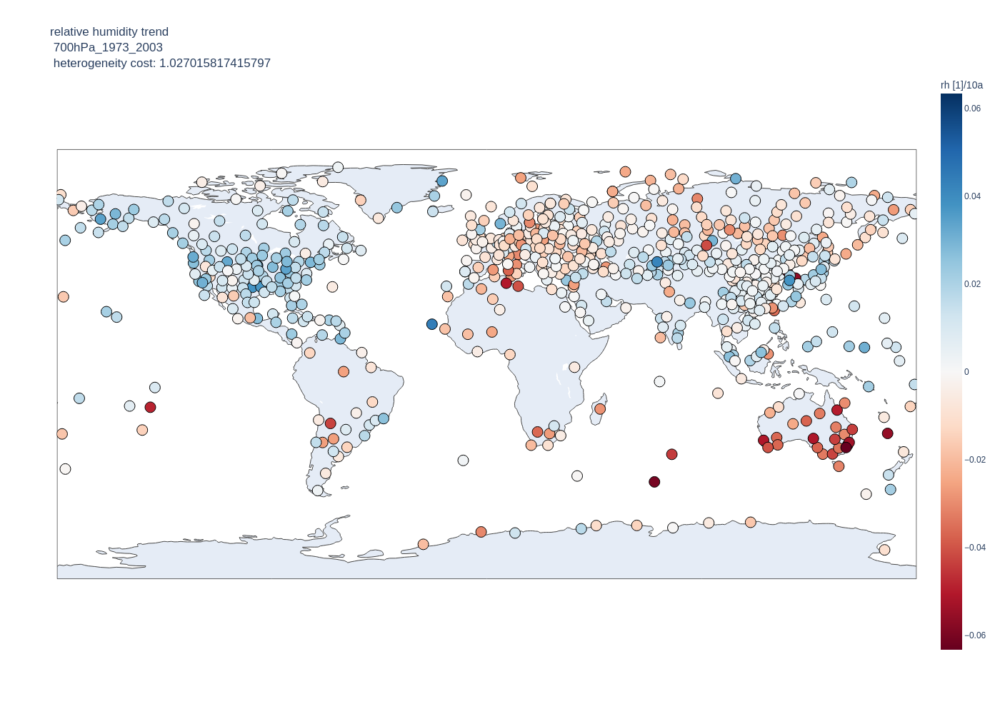

In [43]:
a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da['at']))
cost = np.sum(a)/len(a)
fig2 = uvp.world_map_plot(da['at'], da.lat, da.lon, da.label, 'relative humidity trend <br> 700hPa_1973_2003 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a')

img = fig2.to_image(format="png")
Image(img) 

,lat,lon,st,at,label,heterogeneity
386,-49.349998,70.250000,-0.057871,-0.060665,0-20000-0-61998,12.089379
698,-34.950001,150.529999,-0.063345,-0.063345,0-20000-0-94750,11.629224
567,-33.930000,151.169998,-0.055246,-0.055246,0-20000-0-94767,8.943925
503,-29.030001,167.929993,-0.056540,-0.055739,0-20000-0-94996,8.873100
661,-32.799999,151.830002,-0.055432,-0.053716,0-20000-0-94776,8.409298


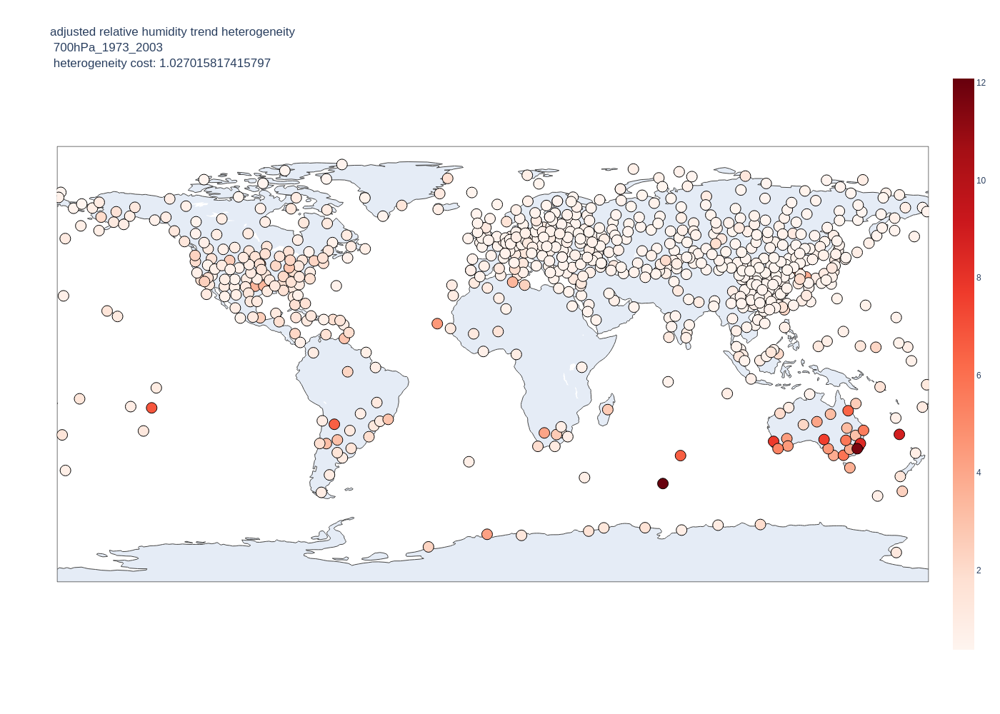

In [44]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'adjusted relative humidity trend heterogeneity <br> 700hPa_1973_2003 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

## 1973 - 2003 300 hPa

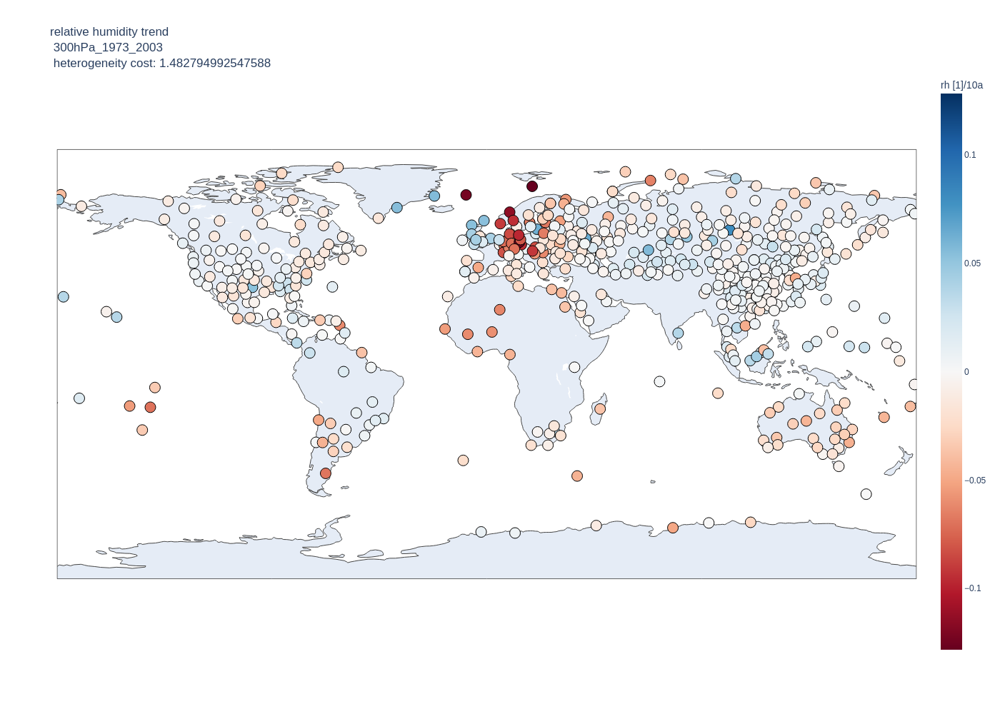

In [45]:
import pickle
sys.path.append(os.getcwd()+'/../resort/rasotools-master/')
import rasotools

good_results = {}
good_results['lat'] = []
good_results['lon'] = []
good_results['st'] = []
good_results['at'] = []
good_results['label'] = []
results = pickle.load(open('polyfit_trends_300hPa_1973_2003_Trend.p', 'rb'))
for i in results:
    badflag = 0
    for j in i:
        try:
            if np.isnan(j):
                badflag = 1
        except:
            pass
    if badflag == 0:
        good_results['lat'].append(i[1])
        good_results['lon'].append(i[2])
        good_results['st'].append(i[3][0])
        good_results['at'].append(i[4][0])
        good_results['label'].append(i[0].split('/')[-1].split('_')[0])
da = pd.DataFrame.from_dict(good_results)

statnum = len(da)

a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da.st))
cost = np.sum(a)/len(a)
fig1 = uvp.world_map_plot(da.st, da.lat, da.lon, da.label, 'relative humidity trend <br> 300hPa_1973_2003 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a')

img = fig1.to_image(format="png")
Image(img) 



,lat,lon,st,at,label,heterogeneity
436,-45.779999,-67.500000,-0.068979,-0.012740,0-20000-0-87860,13.964610
340,51.119999,13.680000,-0.124036,-0.070426,0-20000-0-10488,11.077660
469,-18.070000,-140.949997,-0.070141,-0.094026,0-20000-0-91944,10.236981
487,70.930000,-8.670000,-0.123365,-0.022822,0-20001-0-01001,10.011097
356,74.519997,19.020000,-0.128289,-0.013824,0-20001-0-01028,9.910532


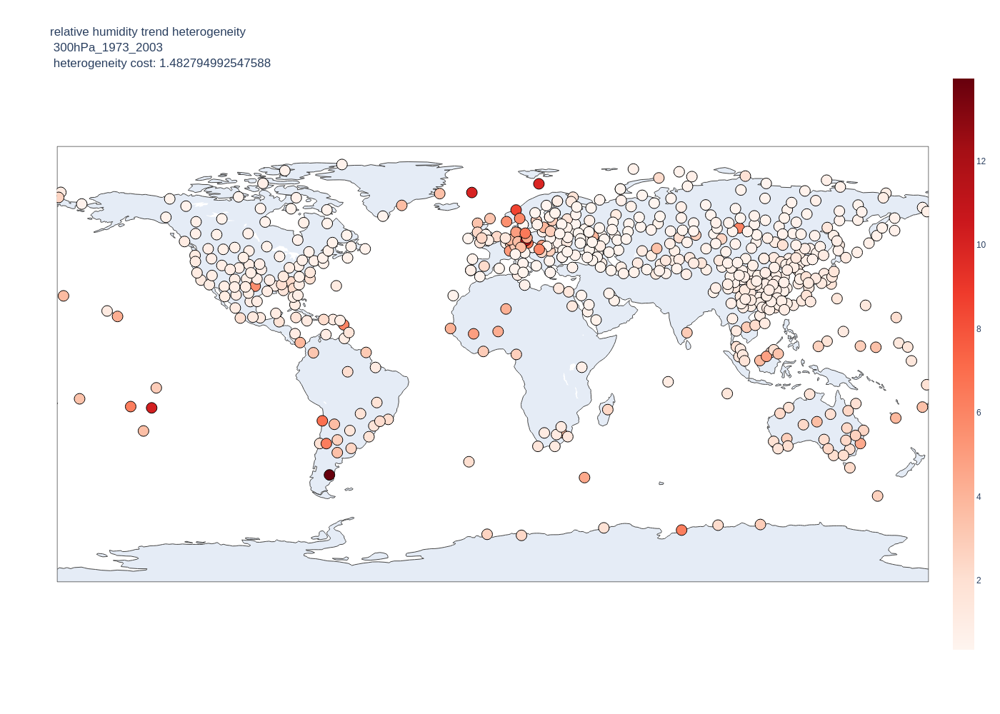

In [46]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'relative humidity trend heterogeneity <br> 300hPa_1973_2003 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

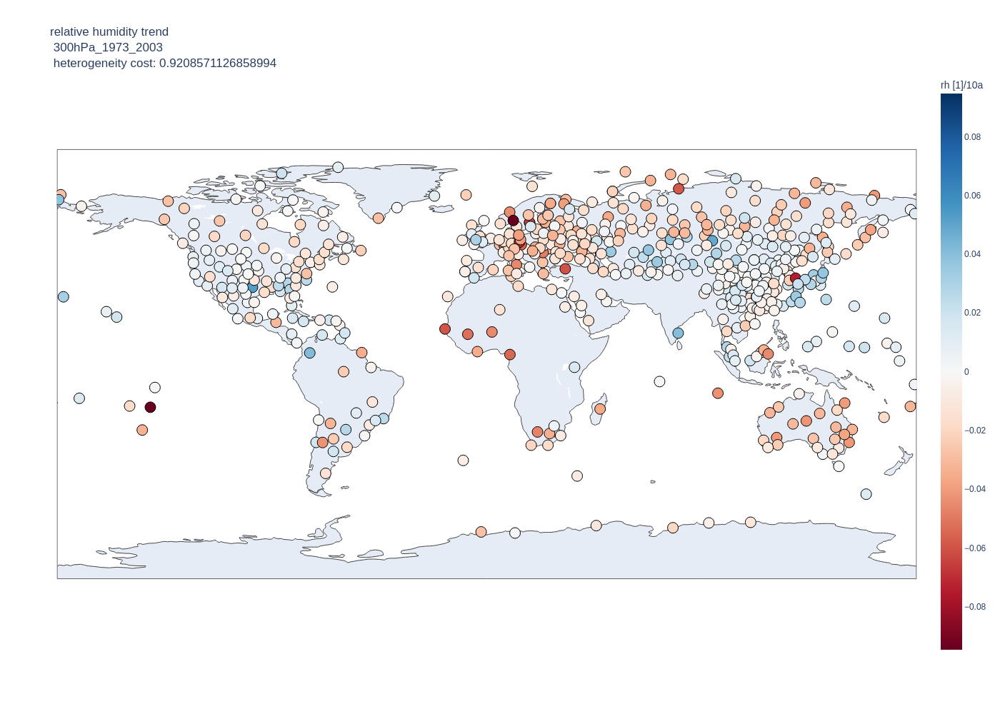

In [47]:
a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da['at']))
cost = np.sum(a)/len(a)
fig2 = uvp.world_map_plot(da['at'], da.lat, da.lon, da.label, 'relative humidity trend <br> 300hPa_1973_2003 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a')

img = fig2.to_image(format="png")
Image(img) 

,lat,lon,st,at,label,heterogeneity
469,-18.070000,-140.949997,-0.070141,-0.094026,0-20000-0-91944,17.206086
376,60.200001,11.100000,-0.094684,-0.094684,0-20000-0-01384,6.066643
312,44.220001,28.650000,-0.074628,-0.086561,0-642-20000-15483,5.461584
358,32.220001,-98.180000,0.052931,0.052931,0-20000-0-72260,5.404741
46,52.470001,9.700000,-0.085569,-0.085569,0-20000-0-10338,5.336655


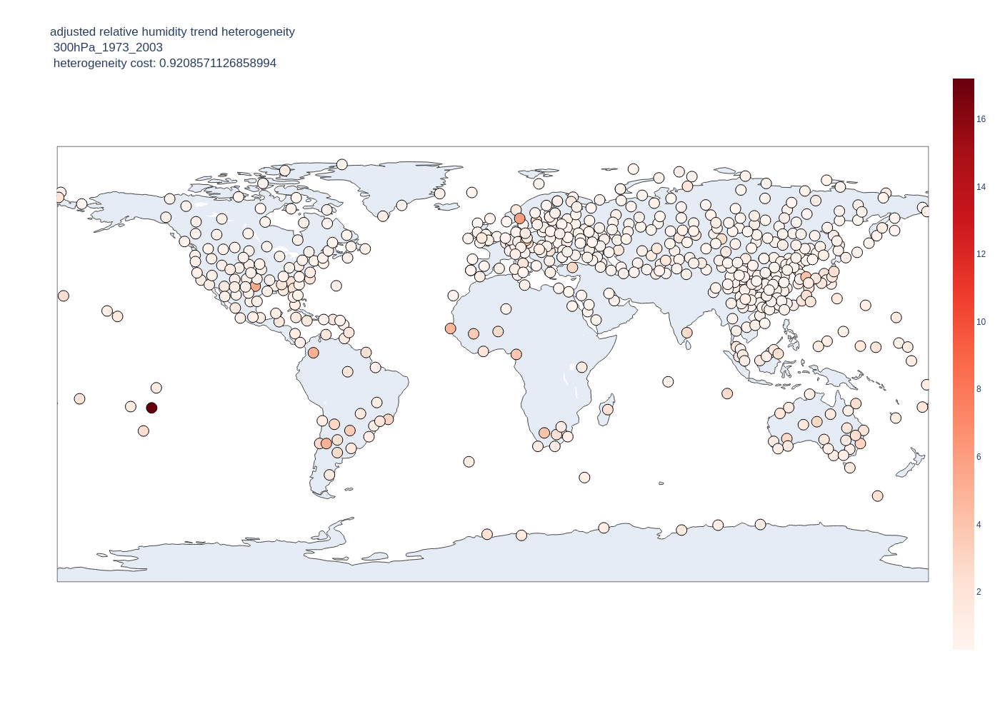

In [48]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'adjusted relative humidity trend heterogeneity <br> 300hPa_1973_2003 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

## 1958 - 1988 700 hPa

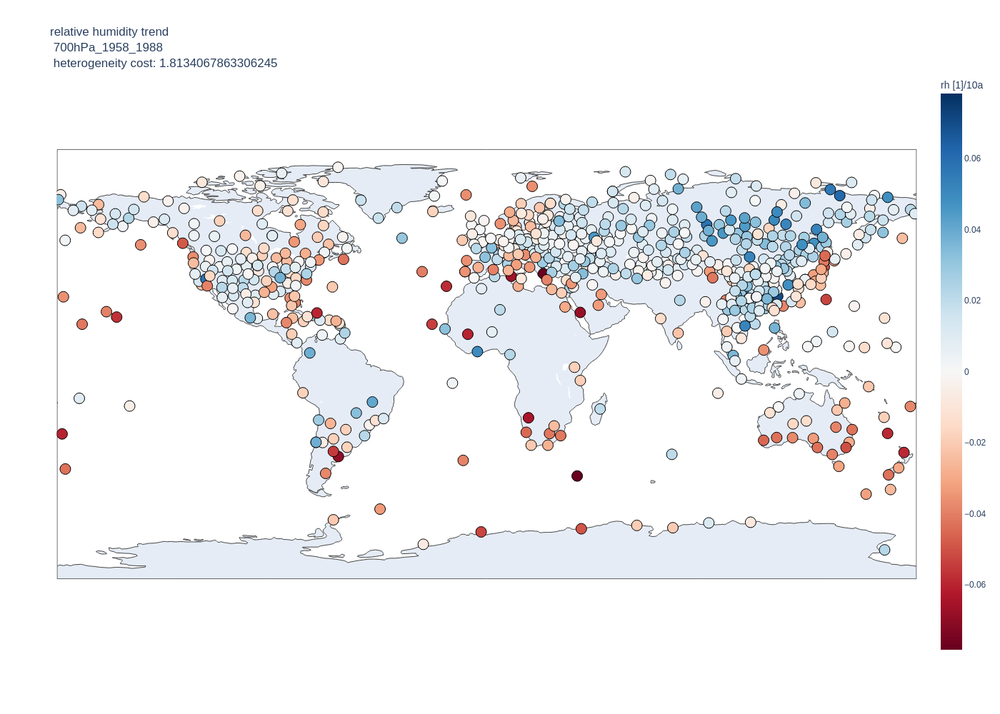

In [49]:
import pickle
sys.path.append(os.getcwd()+'/../resort/rasotools-master/')
import rasotools

good_results = {}
good_results['lat'] = []
good_results['lon'] = []
good_results['st'] = []
good_results['at'] = []
good_results['label'] = []
results = pickle.load(open('polyfit_trends_700hPa_1958_1988_Trend.p', 'rb'))
for i in results:
    badflag = 0
    for j in i:
        try:
            if np.isnan(j):
                badflag = 1
        except:
            pass
    if badflag == 0:
        good_results['lat'].append(i[1])
        good_results['lon'].append(i[2])
        good_results['st'].append(i[3][0])
        good_results['at'].append(i[4][0])
        good_results['label'].append(i[0].split('/')[-1].split('_')[0])
da = pd.DataFrame.from_dict(good_results)

statnum = len(da)

a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da.st))
cost = np.sum(a)/len(a)
fig1 = uvp.world_map_plot(da.st, da.lat, da.lon, da.label, 'relative humidity trend <br> 700hPa_1958_1988 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a')

img = fig1.to_image(format="png")
Image(img) 



,lat,lon,st,at,label,heterogeneity
570,-38.730000,-62.169998,-0.069587,-0.061960,0-20000-0-87750,20.636655
428,-46.880001,37.869999,-0.078256,-0.005007,0-20000-0-68994,18.647778
591,-36.570000,-64.269997,-0.054938,-0.041305,0-20000-0-87623,13.849598
622,-70.320000,-2.370000,-0.052624,-0.033050,0-20300-0-89001,12.327245
602,-29.250000,-177.919998,-0.060739,-0.069881,0-20000-0-93997,11.830127


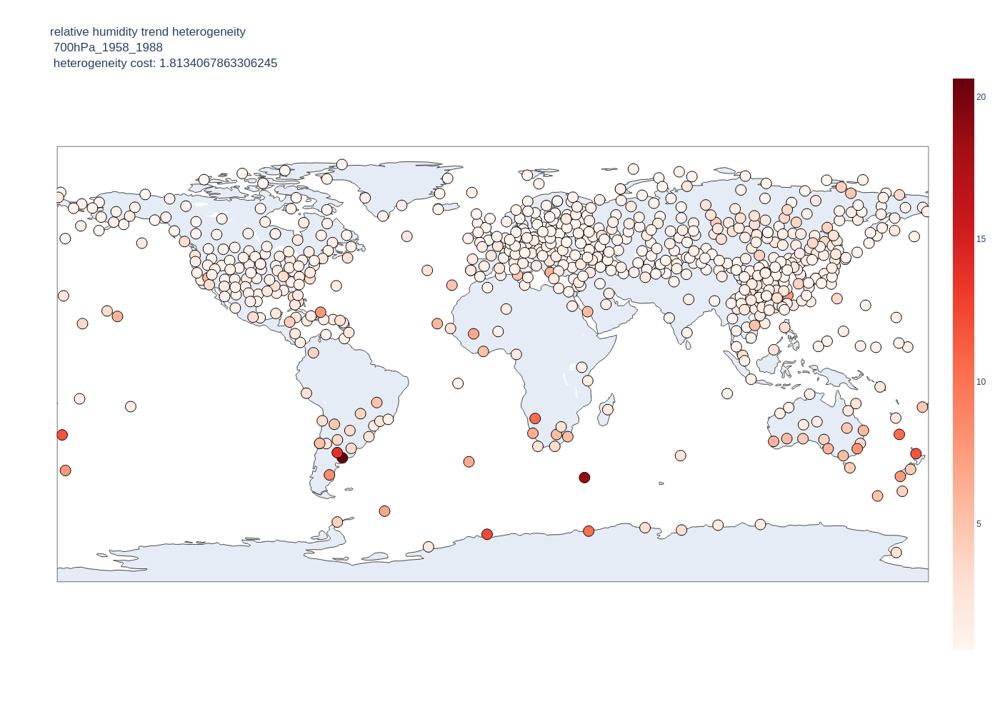

In [50]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'relative humidity trend heterogeneity <br> 700hPa_1958_1988 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

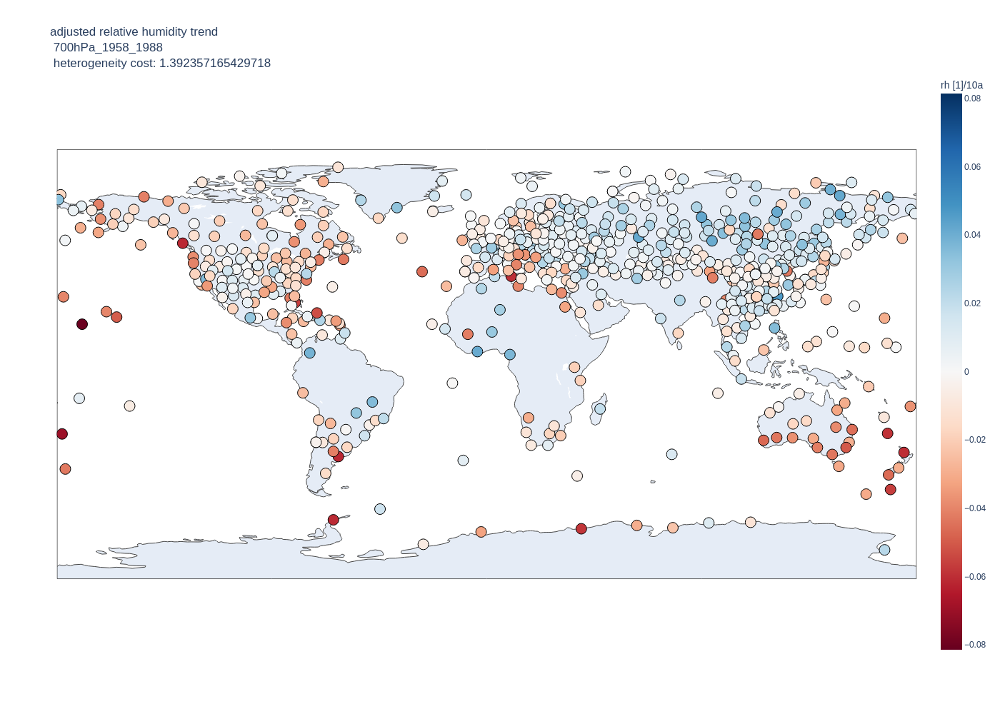

In [51]:
a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da['at']))
cost = np.sum(a)/len(a)
fig2 = uvp.world_map_plot(da['at'], da.lat, da.lon, da.label, 'adjusted relative humidity trend <br> 700hPa_1958_1988 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a')

img = fig2.to_image(format="png")
Image(img) 

,lat,lon,st,at,label,heterogeneity
588,-65.25,-64.269997,-0.020807,-0.061072,0-20000-0-89063,15.496436
570,-38.73,-62.169998,-0.069587,-0.061960,0-20000-0-87750,14.849212
602,-29.25,-177.919998,-0.060739,-0.069881,0-20000-0-93997,14.192923
430,-69.00,39.599998,-0.049416,-0.058574,0-20000-0-89532,11.730666
638,-37.02,174.800003,-0.058920,-0.060414,0-20000-0-93112,11.356115


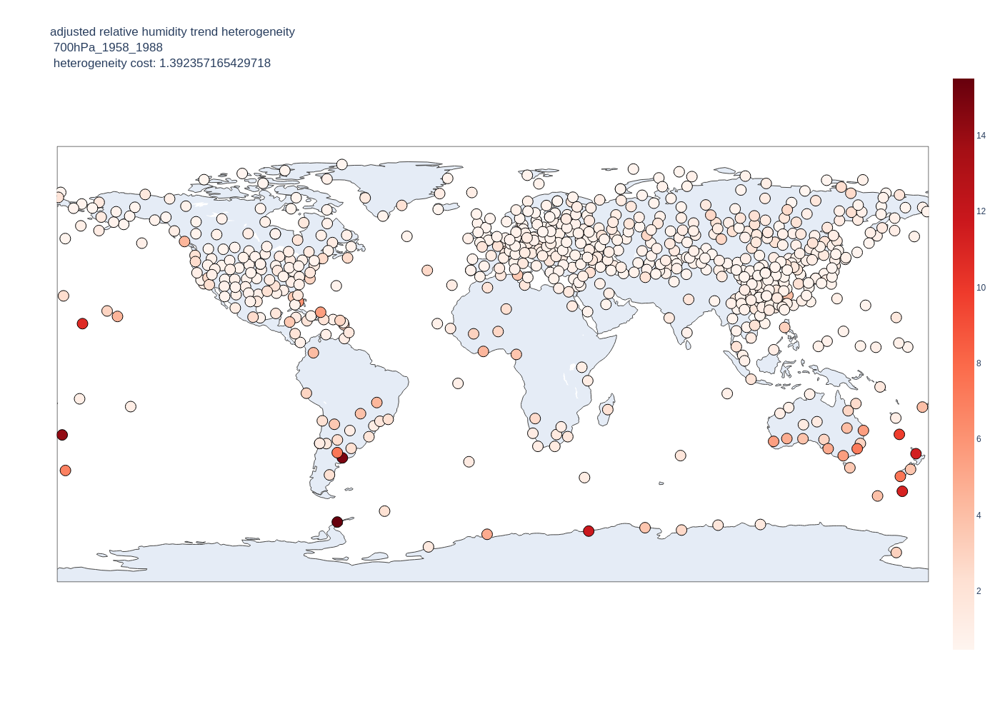

In [52]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'adjusted relative humidity trend heterogeneity <br> 700hPa_1958_1988 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

## 1958 - 1988 300 hPa

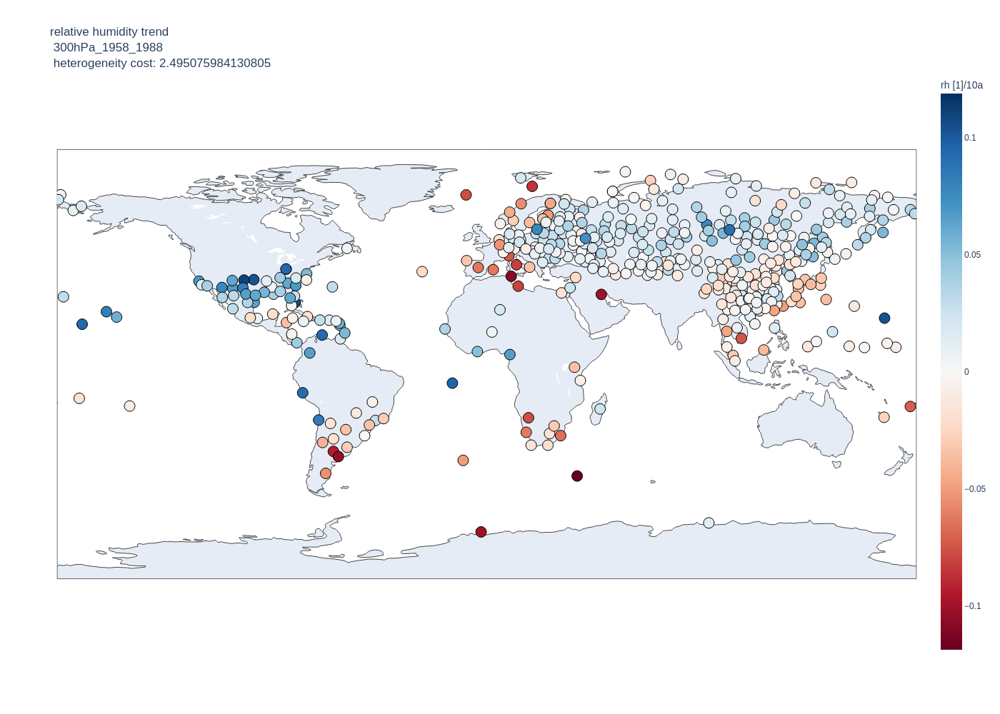

In [53]:
import pickle
sys.path.append(os.getcwd()+'/../resort/rasotools-master/')
import rasotools

good_results = {}
good_results['lat'] = []
good_results['lon'] = []
good_results['st'] = []
good_results['at'] = []
good_results['label'] = []
results = pickle.load(open('polyfit_trends_300hPa_1958_1988_Trend.p', 'rb'))
for i in results:
    badflag = 0
    for j in i:
        try:
            if np.isnan(j):
                badflag = 1
        except:
            pass
    if badflag == 0:
        good_results['lat'].append(i[1])
        good_results['lon'].append(i[2])
        good_results['st'].append(i[3][0])
        good_results['at'].append(i[4][0])
        good_results['label'].append(i[0].split('/')[-1].split('_')[0])
da = pd.DataFrame.from_dict(good_results)

statnum = len(da)

a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da.st))
cost = np.sum(a)/len(a)
fig1 = uvp.world_map_plot(da.st, da.lat, da.lon, da.label, 'relative humidity trend <br> 300hPa_1958_1988 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a')

img = fig1.to_image(format="png")
Image(img) 



,lat,lon,st,at,label,heterogeneity
365,-38.730000,-62.169998,-0.104776,-0.065627,0-20000-0-87750,32.934357
312,-46.880001,37.869999,-0.118769,-0.024087,0-20000-0-68994,31.074740
320,-70.320000,-2.370000,-0.101343,-0.051770,0-20300-0-89001,30.240811
176,-36.570000,-64.269997,-0.094398,-0.069914,0-20000-0-87623,27.123908
149,-12.000000,-77.120003,0.091354,0.053244,0-20000-0-84628,17.134563


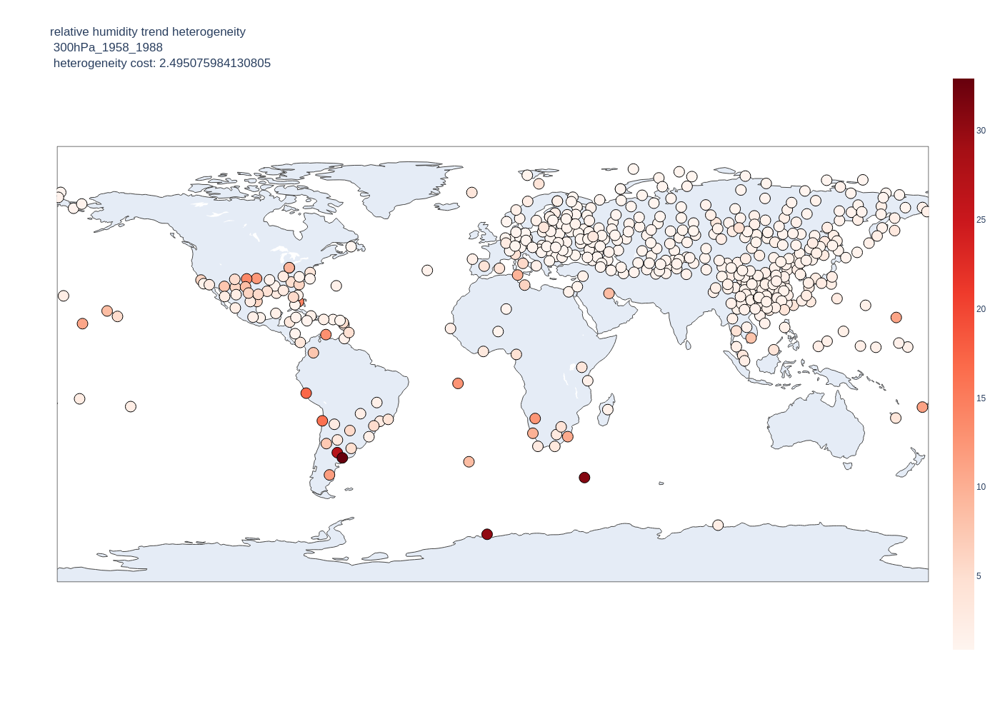

In [54]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'relative humidity trend heterogeneity <br> 300hPa_1958_1988 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

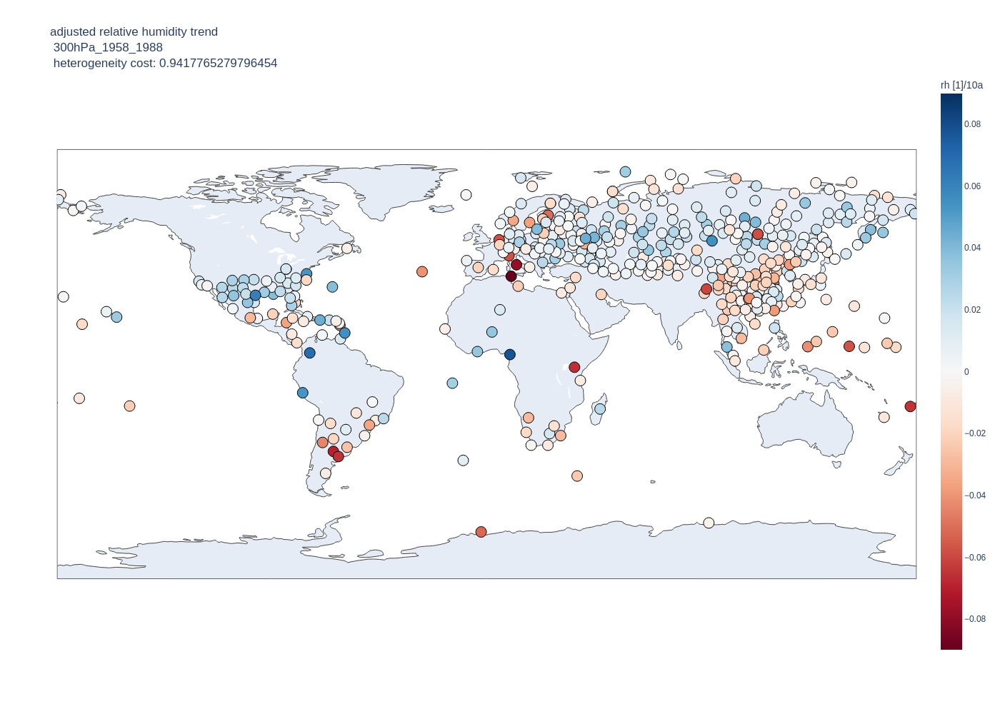

In [55]:
a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da['at']))
cost = np.sum(a)/len(a)
fig2 = uvp.world_map_plot(da['at'], da.lat, da.lon, da.label, 'adjusted relative humidity trend <br> 300hPa_1958_1988 <br> heterogeneity cost: ' + str(cost), show = False, mid = True, cbar_title='rh [1]/10a')

img = fig2.to_image(format="png")
Image(img) 

,lat,lon,st,at,label,heterogeneity
176,-36.57,-64.269997,-0.094398,-0.069914,0-20000-0-87623,13.230313
365,-38.73,-62.169998,-0.104776,-0.065627,0-20000-0-87750,11.886947
283,4.70,-74.150002,0.065715,0.068864,0-20000-0-80222,8.822759
168,-17.75,177.449997,-0.071239,-0.064944,0-20000-0-91680,8.007842
320,-70.32,-2.370000,-0.101343,-0.051770,0-20300-0-89001,7.650876


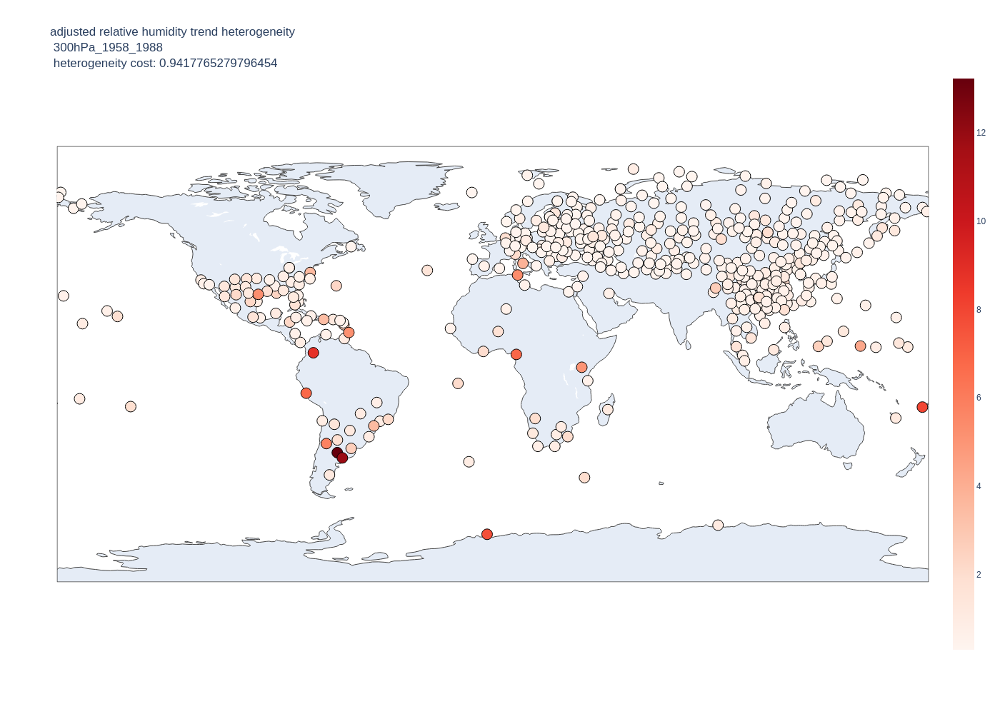

In [56]:
da['heterogeneity'] = a
display(da.sort_values(by=['heterogeneity'], ascending=False).head(5))
fig1 = uvp.world_map_plot(a, da.lat, da.lon, da.label, 'adjusted relative humidity trend heterogeneity <br> 300hPa_1958_1988 <br> heterogeneity cost: ' + str(cost), cs = 'Reds', show = False)
img = fig1.to_image(format="png")
Image(img) 

In [ ]:
rq = {'variable': 'air_temperature', 'statid': '0-20999*', 'date': '19781001-19781031'}
df = eua.vm_request_wrapper(rq )#, overwrite=True , vm_url='http://127.0.0.1:8009')

In [ ]:
counter = 0
for i in df:
    if counter < 3:
        display(df[i])
    counter += 1
print(counter)

In [ ]:
# with open('/users/staff/uvoggenberger/scratch/hug/config/active.json') as json_file:
#     data = json.load(json_file)
    
# slnum = list(data.keys())
# len(list(filter(lambda x: '20999' in x, slnum)))